# PROGETTO GRUPPO UNO, MISURAZIONE PARAMETRI CARATTERISTICI CELLULE DI RANA

Importo le foto e mostro la loro dimensione (per sapere quanti anni ci mettiamo a compilare)

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.ndimage as ndi
from PIL import Image
# Load the JPEG image
import os

A = Image.open('sangue_rana/A.jpg')
B = Image.open('sangue_rana/B.jpg')
C = Image.open('sangue_rana/C.jpg')

A = np.array(A)
B = np.array(B)
C = np.array(C)

print(A.shape)
print(B.shape)
print(C.shape)

(3000, 3000, 3)
(1022, 1022, 3)
(2190, 2190, 3)


# Fotine iniziali

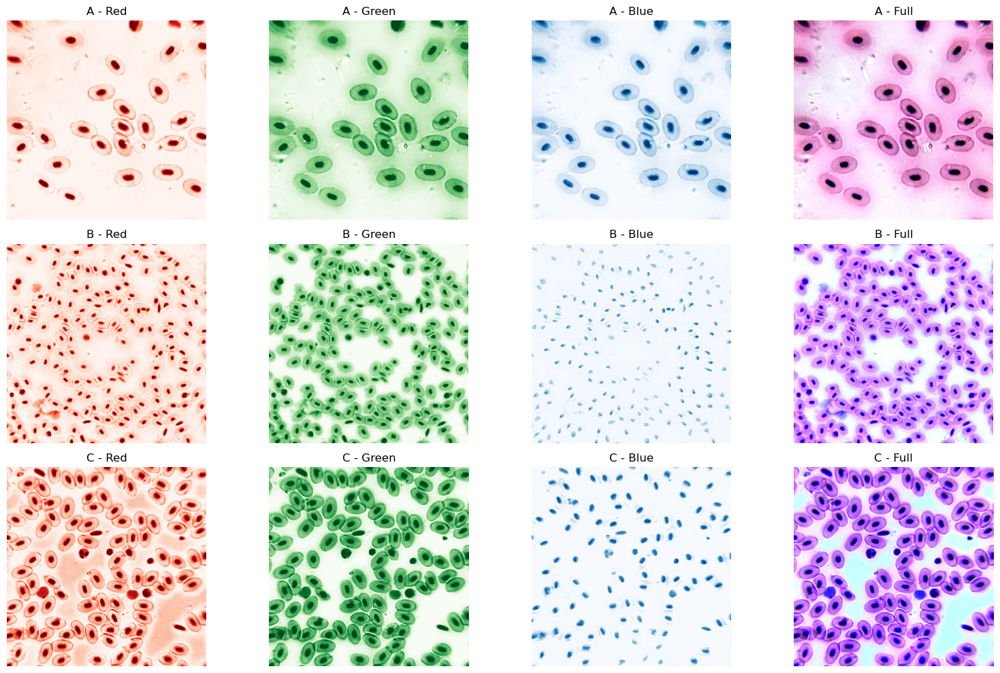

In [2]:
fig, axs = plt.subplots(3, 4, figsize=(16, 10))
cA = np.ones(A.shape,dtype=np.uint8) * 255 - A
cB = np.ones(B.shape,dtype=np.uint8) * 255 - B
cC = np.ones(C.shape,dtype=np.uint8) * 255 - C

images = [cA, cB, cC]
titles = ['A', 'B', 'C']
channels = ['Red', 'Green', 'Blue']
cmaps = ['Reds', 'Greens', 'Blues']

for row, (img, title) in enumerate(zip(images, titles)):
    for col in range(4):
        ax = axs[row, col]
        if col < 3:
            ax.imshow(img[:, :, col], cmap=cmaps[col])
            ax.set_title(f'{title} - {channels[col]}')
        else:
            ax.imshow(np.ones(img.shape,dtype=np.uint8) * 255 - img)
            ax.set_title(f'{title} - Full')
        ax.axis('off')

plt.tight_layout()
plt.show()

<h3> Convoluzione

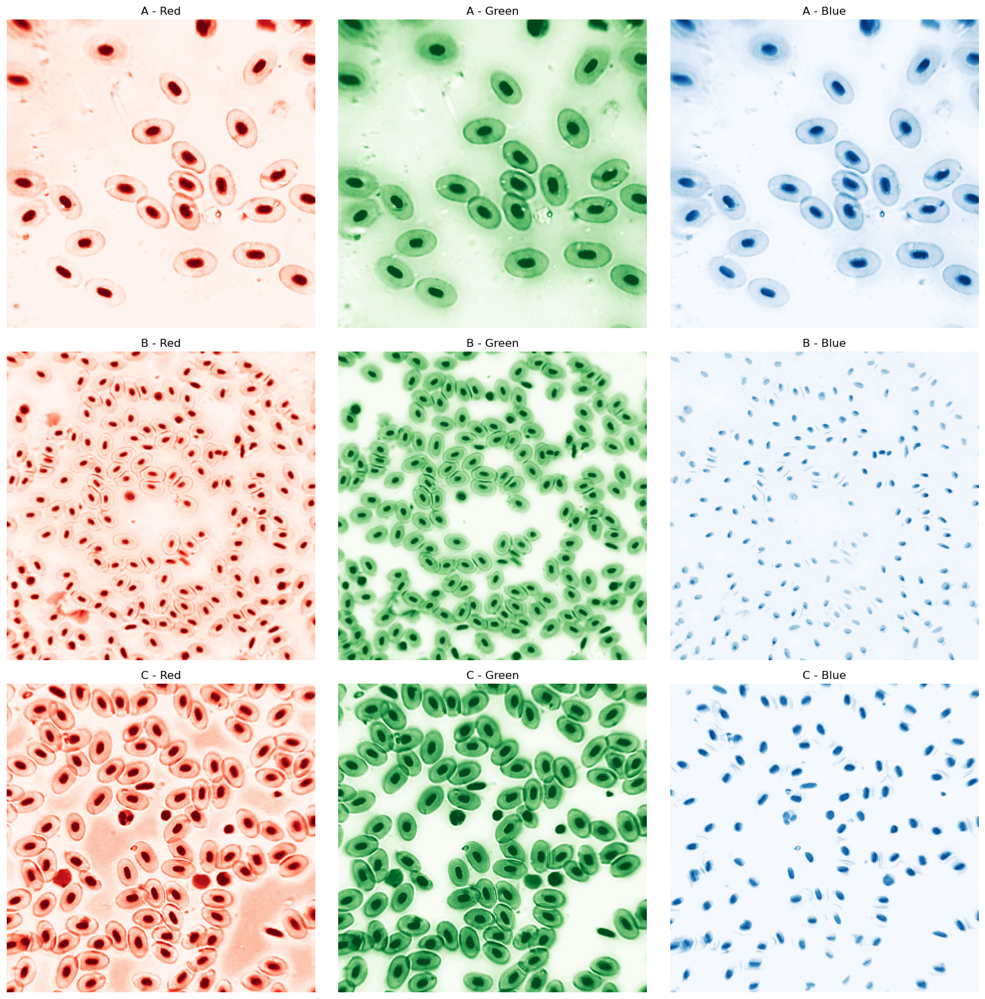

In [3]:
# Applica una convoluzione gaussiana (filtro) a ciascun canale di ogni immagine (A, B, C) con sigma separati
sigma_A = 1
sigma_B = 1
sigma_C = 1

A_convolution = np.stack([ndi.gaussian_filter(A[:, :, ch], sigma_A) for ch in range(3)], axis=-1)
B_convolution = np.stack([ndi.gaussian_filter(B[:, :, ch], sigma_B) for ch in range(3)], axis=-1)
C_convolution = np.stack([ndi.gaussian_filter(C[:, :, ch], sigma_C) for ch in range(3)], axis=-1)

fig, axs = plt.subplots(3, 3, figsize=(15, 15))
filtered_images = [A_convolution, B_convolution, C_convolution]
titles = ['A', 'B', 'C']
channels = ['Red', 'Green', 'Blue']
cmaps = ['Reds_r', 'Greens_r', 'Blues_r']

for i, img in enumerate(filtered_images):
    for j in range(3):
        axs[i, j].imshow(img[:, :, j], cmap=cmaps[j])
        axs[i, j].set_title(f'{titles[i]} - {channels[j]}')
        axs[i, j].axis('off')

plt.tight_layout()
plt.show()

In [4]:
def circleSE(i):
    return (np.mgrid[:i,:i][0] - np.floor(i/2))**2 + (np.mgrid[:i,:i][1] - np.floor(i/2))**2 <= (np.floor(i/2))**2 # SE

from skimage.filters.rank import mean as mean_filter
import csv
import pandas as pd

rA: int = 800
rB: int = 100
rC: int = 200

In [5]:
# BACKGROUND A

BKG_A_red = mean_filter(A_convolution[:, :, 0], circleSE(rA))
pd.DataFrame(BKG_A_red).to_csv('BKG_A_red3.csv', index=False, header=False)

BKG_A_green = mean_filter(A_convolution[:, :, 1], circleSE(rA))
pd.DataFrame(BKG_A_green).to_csv('BKG_A_green3.csv', index=False, header=False)

BKG_A_blue = mean_filter(A_convolution[:, :, 1], circleSE(rA))
pd.DataFrame(BKG_A_blue).to_csv('BKG_A_blue3.csv', index=False, header=False)

In [6]:
# BACKGROUND B

BKG_B_red = mean_filter(B_convolution[:, :, 0], circleSE(rB))
pd.DataFrame(BKG_B_red).to_csv('BKG_B_red.csv', index=False, header=False)

BKG_B_green = mean_filter(B_convolution[:, :, 1], circleSE(rB))
pd.DataFrame(BKG_B_green).to_csv('BKG_B_green.csv', index=False, header=False)

BKG_B_blue = mean_filter(B_convolution[:, :, 2], circleSE(rB))
pd.DataFrame(BKG_B_blue).to_csv('BKG_B_blue.csv', index=False, header=False)

In [7]:
# BACKGROUND C

BKG_C_red = mean_filter(C_convolution[:, :, 0], circleSE(rC))
pd.DataFrame(BKG_C_red).to_csv('BKG_C_red.csv', index=False, header=False)

BKG_C_green = mean_filter(C_convolution[:, :, 1], circleSE(rC))
pd.DataFrame(BKG_C_green).to_csv('BKG_C_green.csv', index=False, header=False)

BKG_C_blue = mean_filter(C_convolution[:, :, 2], circleSE(rC))
pd.DataFrame(BKG_C_blue).to_csv('BKG_C_blue.csv', index=False, header=False)

forse a sto punto ha senso iniziare a studiare le immagini separatamente

# Immagine A

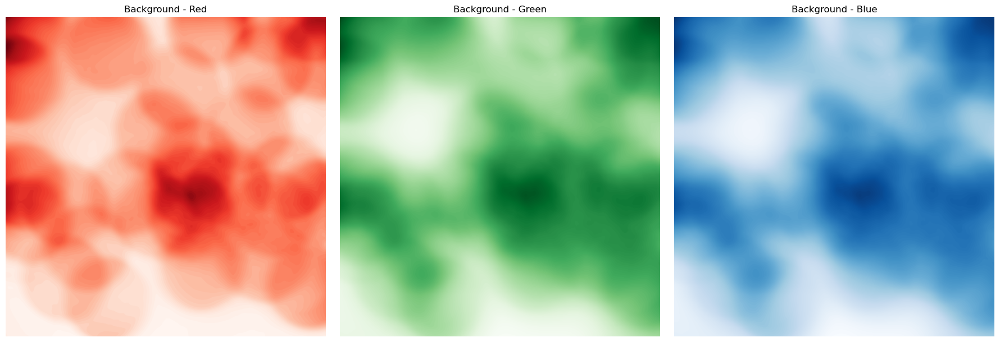

In [8]:
BKG_A_red = pd.read_csv('BKG_A_red3.csv', header=None).to_numpy()
BKG_A_green = pd.read_csv('BKG_A_green3.csv', header=None).to_numpy()
BKG_A_blue = pd.read_csv('BKG_A_blue3.csv', header=None).to_numpy()

fig, axs = plt.subplots(1, 3, figsize=(18, 6))
backgrounds = [BKG_A_red, BKG_A_green, BKG_A_blue]

for i, (bkg, channel, cmap) in enumerate(zip(backgrounds, channels, cmaps)):
    axs[i].imshow(bkg, cmap=cmap)
    axs[i].set_title(f'Background - {channel}')
    axs[i].axis('off')

plt.tight_layout()
plt.show()

<h3> Binary mask

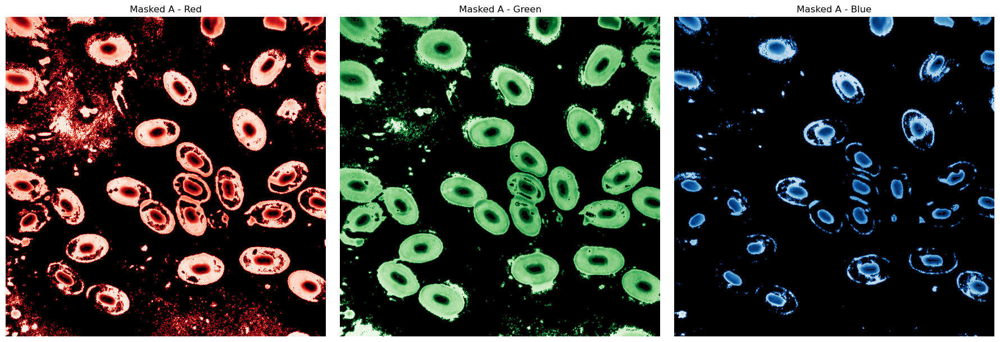

In [9]:
diff = A_convolution[:,:,0] < BKG_A_red
masked_A_red = np.where(diff, A_convolution[:,:,0], 0)

diff = A_convolution[:,:,1] < BKG_A_green
masked_A_green = np.where(diff, A_convolution[:,:,1], 0)

diff = A_convolution[:,:,2] < BKG_A_blue
masked_A_blue = np.where(diff, A_convolution[:,:,2], 0)

fig, axs = plt.subplots(1, 3, figsize=(18, 6))
masked_images = [masked_A_red, masked_A_green, masked_A_blue]
for i, (img, channel, cmap) in enumerate(zip(masked_images, channels, cmaps)):
    axs[i].imshow(img, cmap=cmap, vmin=0, vmax=img.max())
    axs[i].set_title(f'Masked A - {channel}')
    axs[i].axis('off')
    axs[i].imshow(np.ma.masked_where(img != 0, img), cmap='gray', vmin=0, vmax=1, alpha=1)  # overlay black for zeros
plt.tight_layout()
plt.show()

- L'immagine rossa è molto sporca. Ha senso metterla da parte per questa immagine
- L'immagine verde ha del rumore, ma si può sistemare per studiare il citoplasma
- Nel blu sono scomparse quasi tutte le cellule, ma sono rimasti isolati i nuclei

<h3> Hole filling

Riempiamo i nuclei del verde, tanto lo usiamo per il citoplasma.
Quelli che restan fuori li elimino dopo come outliers

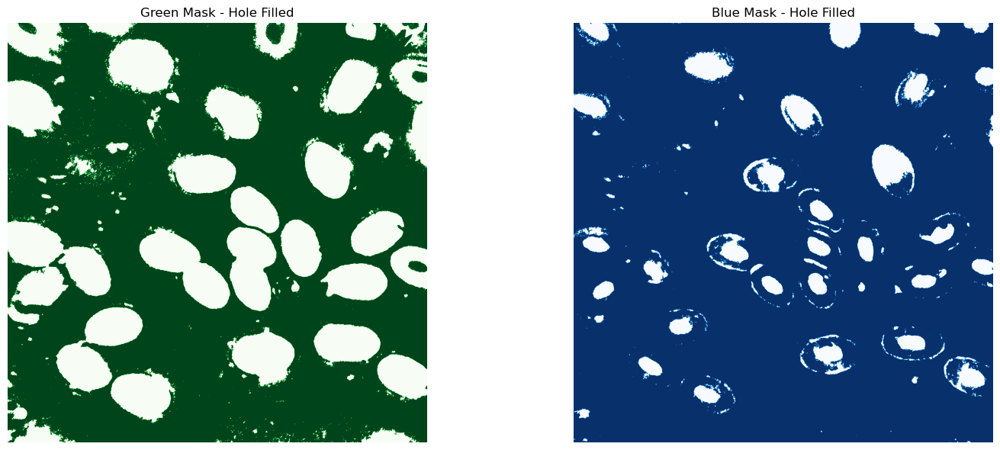

In [10]:
from scipy.ndimage import binary_fill_holes

A_green_filled = binary_fill_holes(masked_A_green, structure=np.ones((3, 3)))
A_blue_filled = binary_fill_holes(masked_A_blue, structure=np.ones((3, 3)))

fig, axs = plt.subplots(1, 2, figsize=(16, 6))

axs[0].imshow(A_green_filled, cmap='Greens_r')
axs[0].set_title('Green Mask - Hole Filled')
axs[0].axis('off')

axs[1].imshow(A_blue_filled, cmap='Blues_r')
axs[1].set_title('Blue Mask - Hole Filled')
axs[1].axis('off')

plt.tight_layout()
plt.show()


<h3> Apertura/erosione

dobbiamo togliere un po' di rumore dal verde

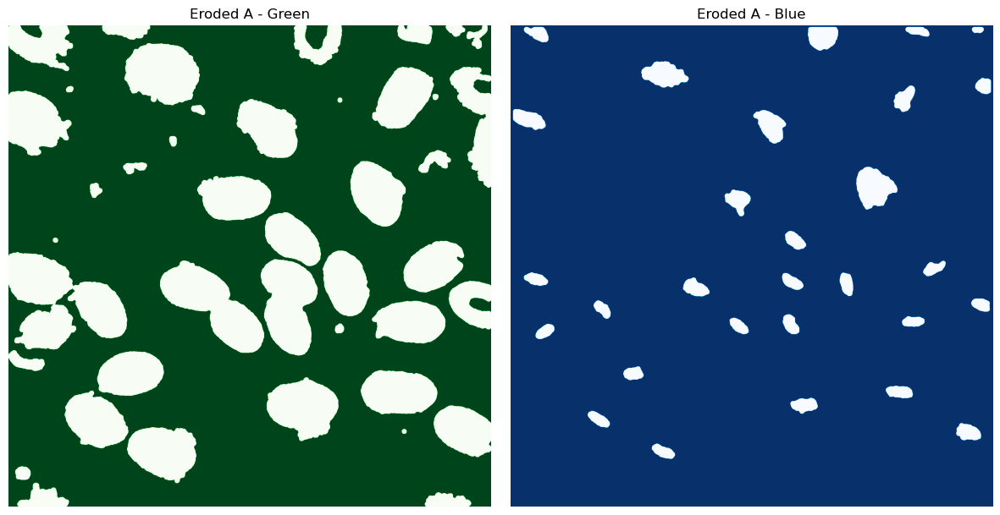

In [11]:
masked_A_green_binary = A_green_filled > 0
#A_green_eroded = ndi.binary_erosion(masked_A_green_binary, structure=circleSE(40))
A_green_eroded = ndi.binary_opening(masked_A_green_binary, structure=circleSE(30))

masked_A_blue_binary = A_blue_filled > 0
# Prima erosione, poi apertura per il blu
A_blue_eroded = ndi.binary_erosion(masked_A_blue_binary, structure=circleSE(30))
A_blue_eroded = ndi.binary_opening(A_blue_eroded, structure=circleSE(30))

fig, axs = plt.subplots(1, 2, figsize=(12, 6))

axs[0].imshow(A_green_eroded, cmap='Greens_r')
axs[0].set_title('Eroded A - Green')
axs[0].axis('off')

axs[1].imshow(A_blue_eroded, cmap='Blues_r')
axs[1].set_title('Eroded A - Blue')
axs[1].axis('off')

plt.tight_layout()
plt.show()


<h3> Eliminazione oggetti piccoli

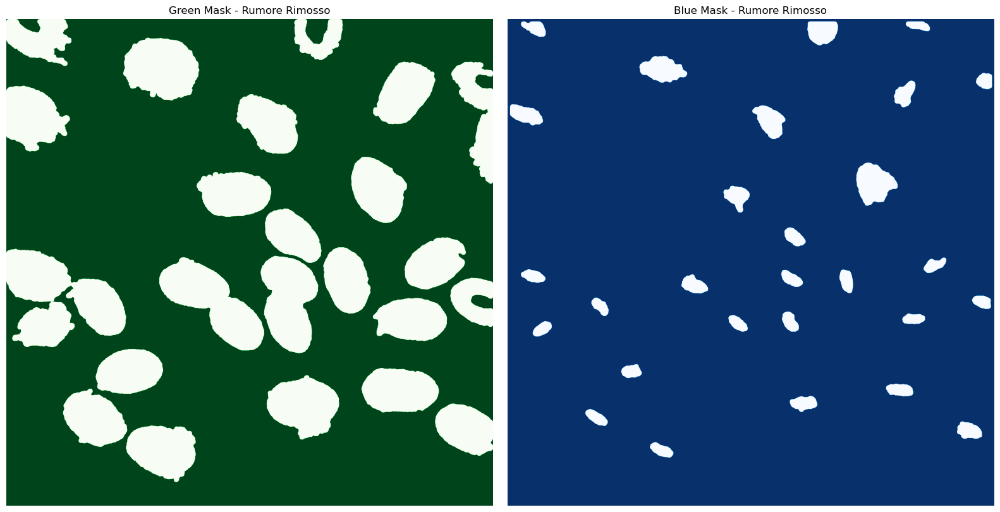

In [12]:
from skimage.morphology import remove_small_objects

min_size_g = 34000   
min_size_b = 4000
# la soglia minima l'ho messa a mano, in realtà non credo sia così tanto arbitraria, perché a questo punto
# è evidente cosa è sporco e cosa è cellula

A_green_clean = remove_small_objects(A_green_eroded.astype(bool), min_size=min_size_g)
A_blue_clean = remove_small_objects(A_blue_eroded.astype(bool), min_size=min_size_b)

fig, axs = plt.subplots(1, 2, figsize=(16, 8))

# Green mask cleaned
axs[0].imshow(A_green_clean, cmap='Greens_r')
axs[0].set_title('Green Mask - Rumore Rimosso')
axs[0].axis('off')

# Blue mask cleaned
axs[1].imshow(A_blue_clean, cmap='Blues_r')
axs[1].set_title('Blue Mask - Rumore Rimosso')
axs[1].axis('off')

plt.tight_layout()
plt.show()



<h3> Blu e verde - mask su immagine di partenza

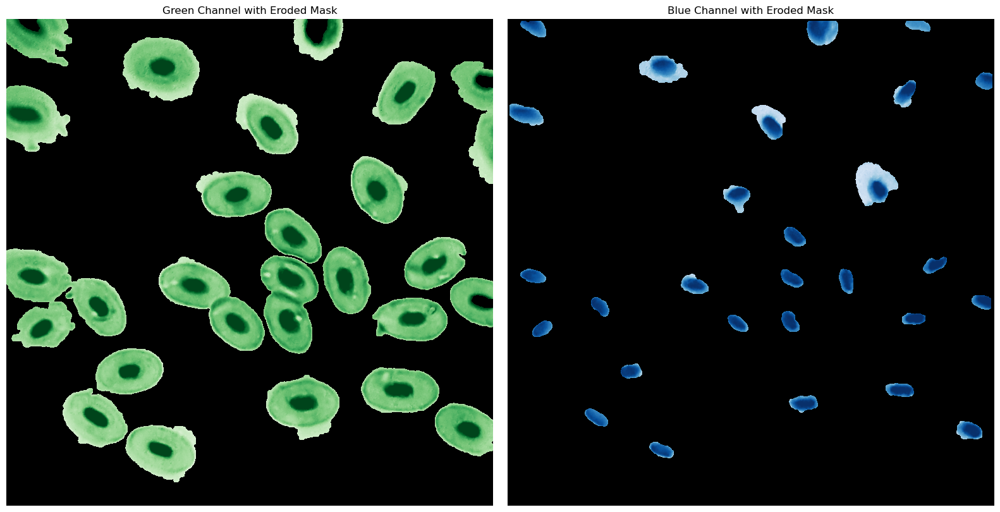

In [13]:
A_green_clean = np.where(A_green_clean, np.nan, 0)
A_blue_clean = np.where(A_blue_clean, np.nan, 0)

fig, axs = plt.subplots(1, 2, figsize=(16, 8))

# Overlay green mask on green channel
axs[0].imshow(A_convolution[:, :, 1], cmap='Greens_r')
axs[0].imshow(A_green_clean, cmap='gray', alpha=1)
axs[0].set_title('Green Channel with Eroded Mask')
axs[0].axis('off')

# Overlay blue mask on blue channel
axs[1].imshow(A_convolution[:, :, 2], cmap='Blues_r')
axs[1].imshow(A_blue_clean, cmap='gray', alpha=1)
axs[1].set_title('Blue Channel with Eroded Mask')
axs[1].axis('off')

plt.tight_layout()
plt.show()

Risultato: dovremo tagliare fuori alcune cellule verdi e alcuni nuclei blu, per errori di erosione.
Nel verde c'è una cellula rotta (da scartare).
Inoltre, in entrambe le immagini abbiamo ancora del rumore.

<h3> Labelling

Number of green objects: 23
Number of blue objects: 28


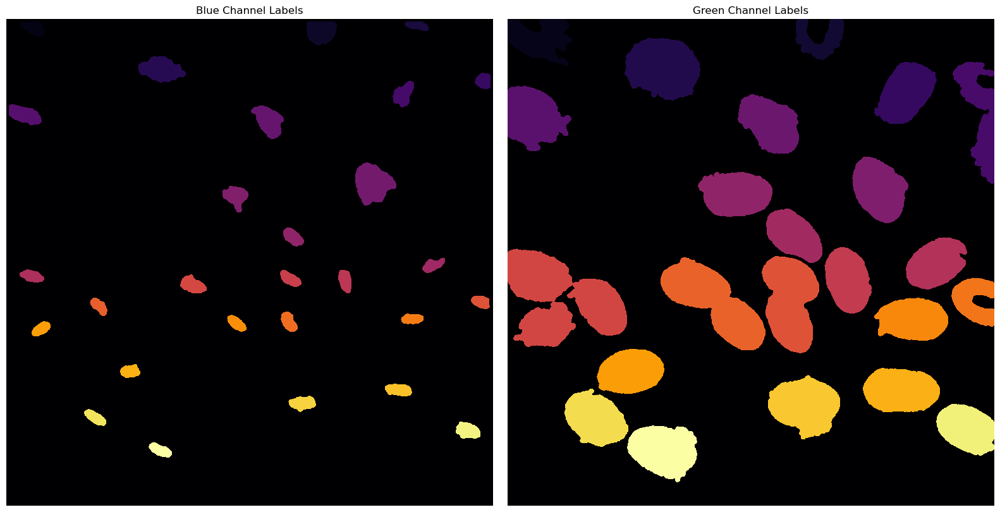

In [14]:
# Label connected components for green mask
green_labels, num_green = ndi.label(A_green_clean)
print(f'Number of green objects: {num_green}')
# Label connected components for blue mask
blue_labels, num_blue = ndi.label(A_blue_clean)
print(f'Number of blue objects: {num_blue}')

fig, axs = plt.subplots(1, 2, figsize=(16, 8))

# Blue labels
axs[0].imshow(blue_labels, cmap='inferno', interpolation='none')
axs[0].set_title('Blue Channel Labels')
axs[0].axis('off')

# Green labels
axs[1].imshow(green_labels, cmap='inferno', interpolation='none', vmin=0)
axs[1].set_title('Green Channel Labels')
axs[1].axis('off')

plt.tight_layout()
plt.show()


- blu (sx): problema di over-segmentation (particelle troppo piccole considerate)
- verde (dx): sia over-segmentation (vedi sopra) che under segmentation (cellule attaccate)

<h3> Cell segmentation

Sta cosa la faccio solo per il verde perché serve a risolvere la sottosegmentazione


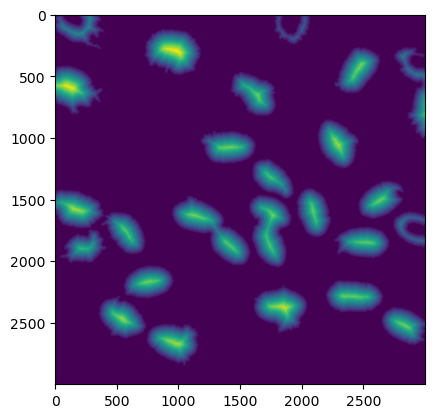

In [15]:
dist_trans = ndi.distance_transform_edt(A_green_clean)
plt.figure()
plt.imshow(dist_trans,interpolation='none',cmap='viridis')
plt.show()

/tmp/ipykernel_14250/829128461.py:6: DeprecationWarning: Please use `maximum_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  dist_trans_dil = ndi.filters.maximum_filter(dist_trans, footprint=struct)


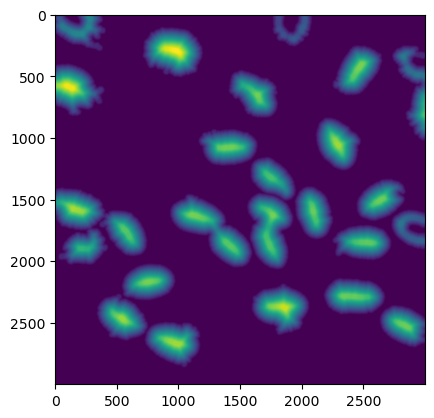

In [16]:
i = 30
mgrid = np.mgrid[:i,:i]
struct = (mgrid[0] - np.floor(i/2))**2 + (mgrid[1] - np.floor(i/2))**2 <= np.floor(i/2)**2

# Running the dilation
dist_trans_dil = ndi.filters.maximum_filter(dist_trans, footprint=struct) 

# Visualizing again
plt.figure()
plt.imshow(dist_trans_dil, cmap='viridis')
plt.show()

<h3> Creazione seeds


sta roba non ho capito tanto cosa faccia, perdonatemi. ctr+i dice che devo mettere una i paragonabile al raggio degli oggetti, e io ho obbedito

In [17]:
from skimage.feature import peak_local_max

seedLoc = peak_local_max(dist_trans_dil, min_distance=150)
seeds = np.zeros_like(dist_trans_dil, dtype=bool)
seeds[tuple(seedLoc.T)] = True

print(f'Number of seeds: {len(seedLoc)}')




Number of seeds: 25


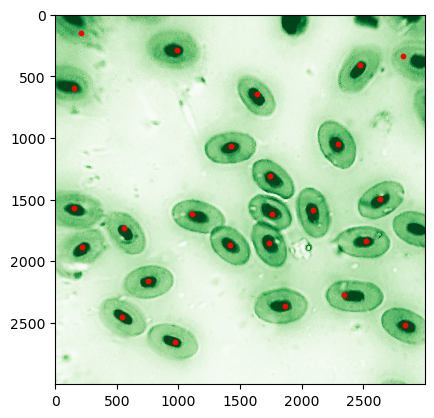

In [18]:
plt.figure()
plt.imshow(filtered_images[0][:,:,1], cmap='Greens_r', interpolation='none')

y, x = np.where(seeds)
plt.scatter(x, y, c='red', s=10, marker='o')
plt.show()

seeds_labeled = ndi.label(seeds)[0]

<h3> Watershed

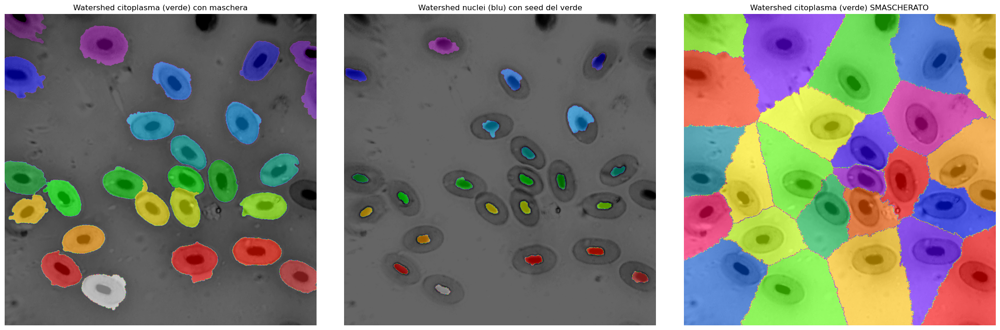

In [19]:
from skimage.segmentation import watershed

# Watershed su verde con maschera
ws = watershed(filtered_images[0][:,:,1], seeds_labeled, connectivity=1, compactness=0.1, 
               watershed_line=True, mask=A_green_clean)

# Watershed su blu con maschera
ws_b = watershed(A_convolution[:, :, 2], seeds_labeled, connectivity=1, compactness=0.1,
                 watershed_line=True, mask=A_blue_clean.astype(bool))

# Watershed su verde SENZA maschera
ws_nomask = watershed(filtered_images[0][:,:,1], seeds_labeled, connectivity=1, compactness=0.1, 
                      watershed_line=True, mask=None)

# Visualizzazione affiancata con cmap categoriale
fig, axs = plt.subplots(1, 3, figsize=(22, 7))

axs[0].imshow(filtered_images[0][:,:,1], cmap='gray')
axs[0].imshow(ws, cmap='nipy_spectral', alpha=0.6)
axs[0].set_title('Watershed citoplasma (verde) con maschera')
axs[0].axis('off')

axs[1].imshow(A_convolution[:, :, 2], cmap='gray')
axs[1].imshow(ws_b, cmap='nipy_spectral', alpha=0.6)
axs[1].set_title('Watershed nuclei (blu) con seed del verde')
axs[1].axis('off')

axs[2].imshow(filtered_images[0][:,:,1], cmap='gray')
axs[2].imshow(ws_nomask, cmap='prism', alpha=0.6)
axs[2].set_title('Watershed citoplasma (verde) SMASCHERATO') # così vi faccio vedere come viene
axs[2].axis('off')

plt.tight_layout()
plt.show()

Decisamente non perfetto, se riuscite a fare meglio, fatelo pure

# Postprocessing


<h3> Elimino le cellule sui bordi

In [20]:
boundary_mask = np.ones(ws.shape, dtype=bool)
boundary_mask = np.logical_not(ndi.binary_erosion(boundary_mask, iterations=15, border_value=0))
clean_ws = np.copy(ws)

In [21]:
def remove_border_cells(label_img, boundary_mask):
    # Copia per non modificare l'input originale
    cleaned = np.copy(label_img)
    for cell_ID in np.unique(cleaned):
        if cell_ID == 0:
            continue
        cell_mask = cleaned == cell_ID
        if np.any(np.logical_and(cell_mask, boundary_mask)):
            cleaned[cell_mask] = 0
    # Rietichetta da 1 a N
    for new_ID, cell_ID in enumerate(np.unique(cleaned)[1:]):
        cleaned[cleaned == cell_ID] = new_ID + 1
    return cleaned

clean_ws = remove_border_cells(ws, boundary_mask)
clean_ws_b = remove_border_cells(ws_b, boundary_mask)


<Figure size 640x480 with 0 Axes>

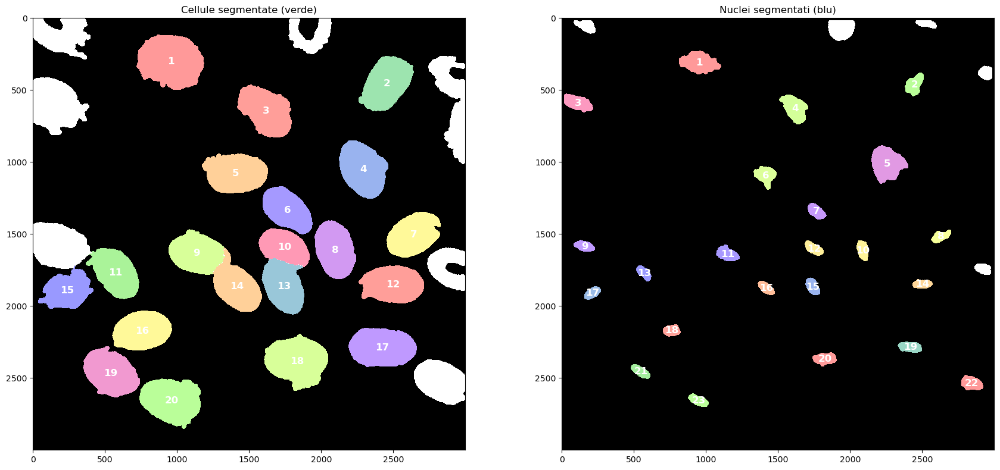

In [22]:
plt.figure()
# Visualizza nuclei segmentati (blu) affiancati al citoplasma segmentato (verde)
fig, axs = plt.subplots(1, 2, figsize=(18, 8))

# Verde (citoplasma)
axs[0].imshow(A_green_clean, interpolation='none', cmap='gray')
axs[0].imshow(np.ma.array(clean_ws, mask=clean_ws == 0), interpolation='none', cmap='prism', alpha=0.4)
for cell_id in np.unique(clean_ws):
    if cell_id == 0:
        continue
    ys, xs = np.where(clean_ws == cell_id)
    if len(xs) > 0 and len(ys) > 0:
        y_c, x_c = np.mean(ys), np.mean(xs)
        axs[0].text(x_c, y_c, str(cell_id), color='white', fontsize=12, ha='center', va='center', weight='bold')
axs[0].set_title("Cellule segmentate (verde)")

# Blu (nuclei)
axs[1].imshow(A_blue_clean, interpolation='none', cmap='gray')
axs[1].imshow(np.ma.array(clean_ws_b, mask=clean_ws_b == 0), interpolation='none', cmap='prism', alpha=0.4)
for cell_id in np.unique(clean_ws_b):
    if cell_id == 0:
        continue
    ys, xs = np.where(clean_ws_b == cell_id)
    if len(xs) > 0 and len(ys) > 0:
        y_c, x_c = np.mean(ys), np.mean(xs)
        axs[1].text(x_c, y_c, str(cell_id), color='white', fontsize=12, ha='center', va='center', weight='bold')
axs[1].set_title("Nuclei segmentati (blu)")

plt.tight_layout()
plt.show()

<h3> Elimino gli outliers

Nel verde elimino la cellula 15, perché è rotta (evidente dalla foto originale)

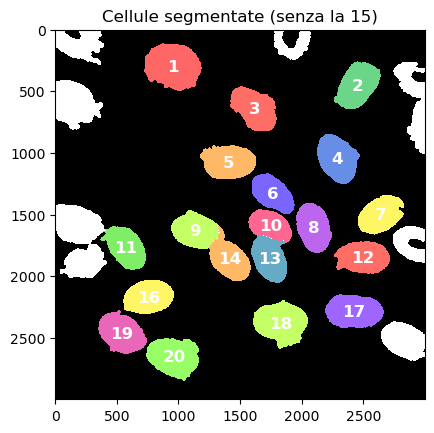

In [23]:
# Elimina la cellula 15 dal risultato della segmentazione
clean_ws_no15 = np.copy(clean_ws)
clean_ws_no15[clean_ws_no15 == 15] = 0

plt.figure()
plt.imshow(A_green_clean, interpolation='none', cmap='gray')
plt.imshow(np.ma.array(clean_ws_no15, mask=clean_ws_no15 == 0), interpolation='none', cmap='prism', alpha=0.6)

for cell_id in np.unique(clean_ws_no15):
    if cell_id == 0:
        continue
    ys, xs = np.where(clean_ws_no15 == cell_id)
    if len(xs) > 0 and len(ys) > 0:
        y_c, x_c = np.mean(ys), np.mean(xs)
        plt.text(x_c, y_c, str(cell_id), color='white', fontsize=12, ha='center', va='center', weight='bold')

plt.title("Cellule segmentate (senza la 15)")
plt.show()

Nel blu elimino 1, 4, 5, 6 (ci sono evidenti pezzi di cellule attaccati) e la 3 (per qualche motivo, anche se è sul bordo, non viene tagliata fuori)

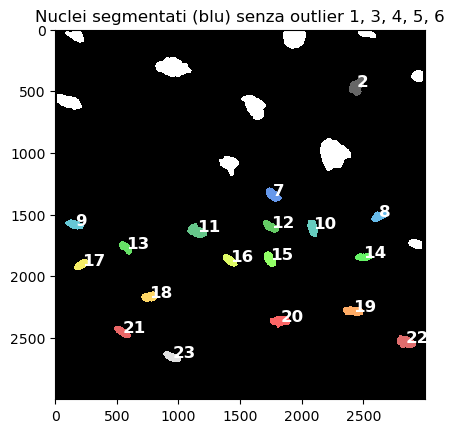

In [24]:
# Elimina le cellule 1, 3, 4, 5, 6 dal risultato della segmentazione blu
clean_ws_b_no_outliers = np.copy(clean_ws_b)
for cell_id in [1, 3, 4, 5, 6]:
    clean_ws_b_no_outliers[clean_ws_b_no_outliers == cell_id] = 0

plt.figure()
plt.imshow(A_blue_clean, interpolation='none', cmap='gray')
plt.imshow(np.ma.array(clean_ws_b_no_outliers, mask=clean_ws_b_no_outliers == 0), interpolation='none', 
            cmap='nipy_spectral', alpha=0.6)

for cell_id in np.unique(clean_ws_b_no_outliers):
    if cell_id == 0:
        continue
    ys, xs = np.where(clean_ws_b_no_outliers == cell_id)
    if len(xs) > 0 and len(ys) > 0:
        y_c, x_c = np.mean(ys), np.mean(xs)
        plt.text(x_c, y_c, str(cell_id), color='white', fontsize=12, weight='bold')

plt.title("Nuclei segmentati (blu) senza outlier 1, 3, 4, 5, 6")
plt.show()

<h3> Bordi delle cellule

In [44]:
# Crea la versione "pulita" per i nuclei blu senza outlier
clean_ws_b = clean_ws_b_no_outliers

# Calcola i bordi per i nuclei blu
edges_blue = np.zeros_like(clean_ws_b)
for cell_ID in np.unique(clean_ws_b)[1:]:
    cell_mask = clean_ws_b == cell_ID
    eroded_cell_mask = ndi.binary_erosion(cell_mask, iterations=1)
    edge_mask = np.logical_xor(cell_mask, eroded_cell_mask)
    edges_blue[edge_mask] = cell_ID

# Calcola i bordi per le cellule verdi
edges = np.zeros_like(clean_ws)
for cell_ID in np.unique(clean_ws)[1:]:
    cell_mask = clean_ws == cell_ID
    eroded_cell_mask = ndi.binary_erosion(cell_mask, iterations=1)
    edge_mask = np.logical_xor(cell_mask, eroded_cell_mask)
    edges[edge_mask] = cell_ID


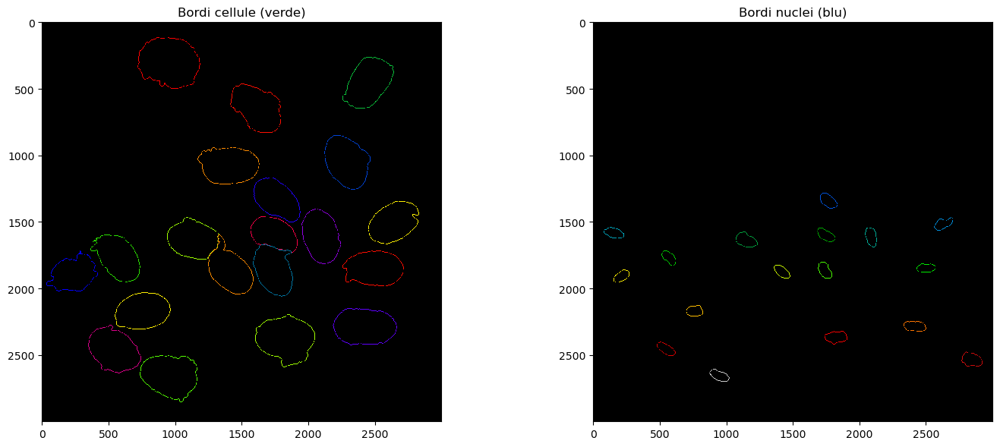

In [50]:
from scipy.ndimage import binary_dilation

# Dilatazione per rendere i bordi più spessi (fattore 2, puoi aumentare iterations per bordi ancora più spessi)
edges_thick = np.zeros_like(edges)
for cell_ID in np.unique(edges)[1:]:
    edge_mask = edges == cell_ID
    thick_mask = binary_dilation(edge_mask, iterations=8)
    edges_thick[thick_mask] = cell_ID

edges_blue_thick = np.zeros_like(edges_blue)
for cell_ID in np.unique(edges_blue)[1:]:
    edge_mask = edges_blue == cell_ID
    thick_mask = binary_dilation(edge_mask, iterations=8)
    edges_blue_thick[thick_mask] = cell_ID

plt.figure(figsize=(15, 6))

# Bordi cellule (verde)
plt.subplot(1, 2, 1)
plt.imshow(np.zeros_like(edges), cmap='gray', vmin=0, vmax=1)  # Black background
plt.imshow(np.ma.array(edges_thick, mask=edges_thick == 0), interpolation='none', cmap='prism')
plt.title('Bordi cellule (verde)')

# Bordi nuclei (blu)
plt.subplot(1, 2, 2)
plt.imshow(np.zeros_like(edges_blue), cmap='gray', vmin=0, vmax=1)  # Black background
plt.imshow(np.ma.array(edges_blue_thick, mask=edges_blue_thick == 0), interpolation='none', cmap='nipy_spectral')
plt.title('Bordi nuclei (blu)')

plt.tight_layout()
plt.show()

# Contazzi (finalmente)

In [51]:
results = {"cell_id":[],
           "green_mean":[],
           "green_mem_mean":[],
           "cell_area":[],
           "cell_edge":[],
           "blue_mean":[],
           "blue_mem_mean":[]}

for cell_id in np.unique(clean_ws)[1:]:
    cell_mask = clean_ws == cell_id
    edge_mask = edges == cell_id
    blue_mask = clean_ws_b == cell_id
    blue_edge_mask = edges_blue == cell_id

    results["cell_id"].append(cell_id.item())
    results["green_mean"].append(np.mean(A_convolution[:,:,1][cell_mask]).item())
    results["green_mem_mean"].append(np.mean(A_convolution[:,:,1][edge_mask]).item())
    results["cell_area"].append(np.sum(cell_mask).item())
    results["cell_edge"].append(np.sum(edge_mask).item())
    results["blue_mean"].append(np.mean(A_convolution[:,:,2][blue_mask]).item())
    results["blue_mem_mean"].append(np.mean(A_convolution[:,:,2][blue_edge_mask]).item())

for key in results.keys():
    print(key, '\n', results[key], '\n')


/usr/lib/python3/dist-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/lib/python3/dist-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


cell_id 
 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20] 

green_mean 
 [126.53026861760209, 117.58075298363615, 130.1456730273337, 110.49721553660083, 116.84011322604199, 95.01938265530725, 108.28137971014493, 100.8074738210937, 114.17074014694518, 91.10376903361978, 117.9673318689536, 108.94942263032287, 91.76430211394107, 107.01073095951502, 119.12096042437356, 124.28916961091483, 111.21962134251291, 123.22860272781249, 136.5802800212043, 145.07790693437306] 

green_mem_mean 
 [179.3138847858198, 170.17285067873303, 191.50437062937064, 174.39305816135084, 176.97231833910035, 147.8301687763713, 153.40057636887607, 142.0268123138034, 173.0639698965193, 132.32840549102428, 164.3111111111111, 143.47826086956522, 135.91181818181818, 153.74614065180103, 155.13676731793961, 172.33045148895292, 161.57756354075372, 179.66129032258064, 182.3, 192.7451963241437] 

cell_area 
 [137370, 97532, 96950, 99301, 99977, 77234, 86250, 87666, 86699, 66330, 85588, 93441, 84061, 8

# Analisi e visualizzazione

In [52]:
def print_summary(data):
    data = np.array(data)
    data = data[~np.isnan(data)]  # rimuove i nan
    if len(data) == 0:
        print("  Nessun dato valido.")
        return
    print ("  Mean:    {:7.2f}".format(np.mean(data)))
    print ("  Stdev:   {:7.2f}".format(np.std(data)))
    print ("  Max:     {:7.2f}".format(np.max(data)))
    print ("  Min:     {:7.2f}".format(np.min(data)))
    print ("  Median:  {:7.2f}".format(np.median(data)))

# Calling the custom function for each dataset
for key in results.keys():
    print('\n' + key)
    print_summary(results[key])

from scipy.stats import describe
data = np.array(results['green_mean'])
data = data[~np.isnan(data)]
stat_summary = describe(data)

print('\nscipy.stats.describe of green_mean')
for key in stat_summary._asdict().keys():
    print(' ', key, stat_summary._asdict()[key])


cell_id
  Mean:      10.50
  Stdev:      5.77
  Max:       20.00
  Min:        1.00
  Median:    10.50

green_mean
  Mean:     114.81
  Stdev:     13.81
  Max:      145.08
  Min:       91.10
  Median:   115.51

green_mem_mean
  Mean:     164.11
  Stdev:     17.50
  Max:      192.75
  Min:      132.33
  Median:   167.24

cell_area
  Mean:    93814.40
  Stdev:   15706.46
  Max:     137370.00
  Min:     66330.00
  Median:  91723.50

cell_edge
  Mean:    1109.70
  Stdev:     92.05
  Max:     1354.00
  Min:      947.00
  Median:  1115.00

blue_mean
  Mean:      35.84
  Stdev:     11.38
  Max:       63.42
  Min:       21.09
  Median:    33.94

blue_mem_mean
  Mean:      75.93
  Stdev:     20.46
  Max:      122.50
  Min:       53.29
  Median:    67.23

scipy.stats.describe of green_mean
  nobs 20
  minmax (91.10376903361978, 145.07790693437306)
  mean 114.80925486961246
  variance 200.74969478362738
  skewness 0.14661317953508407
  kurtosis -0.3210573280447768


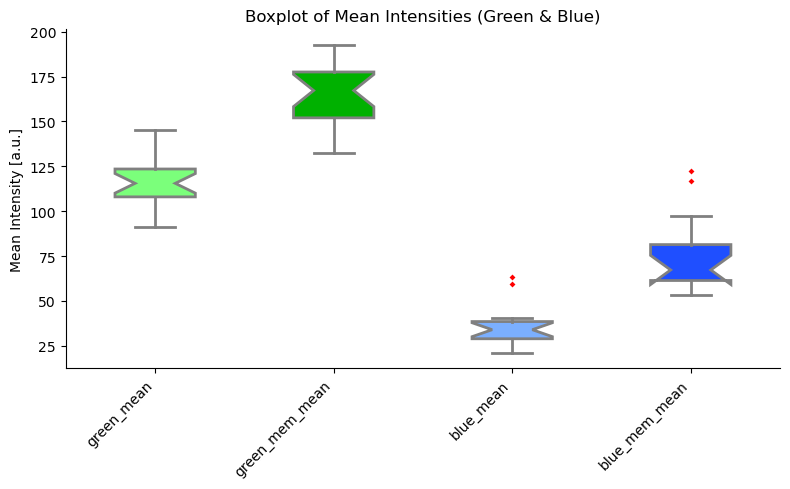

In [53]:
import numpy as np

# Scegli le chiavi che vuoi visualizzare nel boxplot
boxplot_keys = ['green_mean', 'green_mem_mean', 'blue_mean', 'blue_mem_mean']

# Filtra i nan per ogni lista
boxplot_data = [np.array(results[key])[~np.isnan(results[key])] for key in boxplot_keys]

fig = plt.figure(figsize=(8, 5))
ax = fig.gca()

bplot = ax.boxplot(boxplot_data, notch=True, patch_artist=True)

colors = ['#7BFF7B', '#00b100', '#7bafff', '#1f4fff']
for patch, color in zip(bplot['boxes'], colors):
    patch.set_facecolor(color)
    patch.set_edgecolor('gray')
    patch.set_linewidth(2)

plt.setp(bplot['whiskers'], color='gray', linestyle='-', lw=2)
plt.setp(bplot['caps'], color='gray', lw=2)
plt.setp(bplot['medians'], linestyle='none')
plt.setp(bplot['fliers'], marker='D', markerfacecolor='red',
         markeredgewidth=0, markersize=3)

ax.set_xticklabels(boxplot_keys, rotation=45, ha='right')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.set_title('Boxplot of Mean Intensities (Green & Blue)')
ax.set_ylabel('Mean Intensity [a.u.]')

plt.tight_layout()
plt.show()
